In [2]:
# # %pip install -r requirements-beocat-cpu.txt
# %pip install opencv-python-headless==5.0.0.93
# %pip install torch==2.7.1 torchvision==0.22.1 --index-url https://download.pytorch.org/whl/cu128
# %pip install numpy==2.0.2 pandas==2.3.3 matplotlib==3.9.4 seaborn pillow==11.3.0 opencv-python-headless==5.0.0.93 scipy==1.13.1 scikit-learn==1.6.1 tqdm==4.70.1 networkx==3.2.1 rembg==2.0.50 onnxruntime==1.19.2 ipywidgets==8.1.9 ipympl==0.10.0


import sys
print("Kernel Python:", sys.executable)
# %pip uninstall -y torch torchvision torchaudio
# %pip install --no-cache-dir torch==2.7.1 torchvision==0.22.1 --index-url https://download.pytorch.org/whl/cu128

Kernel Python: /homes/mxqasim/Chocolathon/.venv/bin/python


In [3]:
import sys, torch, torchvision
print("Python:", sys.executable)
print("Torch:", torch.__version__)
print("Torch CUDA build:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

/homes/mxqasim/Chocolathon/.venv/lib64/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


Python: /homes/mxqasim/Chocolathon/.venv/bin/python
Torch: 2.7.1+cu128
Torch CUDA build: 12.8
CUDA available: True
GPU: NVIDIA GeForce RTX 3090


In [4]:
from pathlib import Path
import pandas as pd
import json

PROJECT_ROOT = Path("/homes/mxqasim/Chocolathon")
BOX_ROOT = PROJECT_ROOT / "data/boxes"
RAW_DIR = BOX_ROOT / "raw"
BOX_MANIFEST = BOX_ROOT / "manifest.csv"

raw_images = sorted(
    p for p in RAW_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

print("Project root:", PROJECT_ROOT)
print("Raw box images:", len(raw_images))
print("Box manifest exists:", BOX_MANIFEST.exists())

if BOX_MANIFEST.exists():
    box_manifest = pd.read_csv(BOX_MANIFEST)
    print("Manifest shape:", box_manifest.shape)
    print("Manifest columns:", box_manifest.columns.tolist())
    display(box_manifest.head())

Project root: /homes/mxqasim/Chocolathon
Raw box images: 16
Box manifest exists: True
Manifest shape: (16, 8)
Manifest columns: ['file', 'box_size', 'annotation_file', 'processed_file', 'status', 'normalized_file', 'grid_annotation_file', 'empty_slot_count']


,file,box_size,annotation_file,processed_file,status,normalized_file,grid_annotation_file,empty_slot_count
0,IMG_2019.jpg,6,/homes/mxqasim/Chocolathon/data/boxes/annotati...,/homes/mxqasim/Chocolathon/data/boxes/processe...,box_pipeline_complete,/homes/mxqasim/Chocolathon/data/boxes/normaliz...,/homes/mxqasim/Chocolathon/data/boxes/grid_ann...,6
1,IMG_2020.jpg,6,/homes/mxqasim/Chocolathon/data/boxes/annotati...,/homes/mxqasim/Chocolathon/data/boxes/processe...,box_pipeline_complete,/homes/mxqasim/Chocolathon/data/boxes/normaliz...,/homes/mxqasim/Chocolathon/data/boxes/grid_ann...,6
2,IMG_2021.jpg,6,/homes/mxqasim/Chocolathon/data/boxes/annotati...,/homes/mxqasim/Chocolathon/data/boxes/processe...,box_pipeline_complete,/homes/mxqasim/Chocolathon/data/boxes/normaliz...,/homes/mxqasim/Chocolathon/data/boxes/grid_ann...,6
3,IMG_2022.jpg,16,/homes/mxqasim/Chocolathon/data/boxes/annotati...,/homes/mxqasim/Chocolathon/data/boxes/processe...,box_pipeline_complete,/homes/mxqasim/Chocolathon/data/boxes/normaliz...,/homes/mxqasim/Chocolathon/data/boxes/grid_ann...,16
4,IMG_2023.jpg,16,/homes/mxqasim/Chocolathon/data/boxes/annotati...,/homes/mxqasim/Chocolathon/data/boxes/processe...,box_pipeline_complete,/homes/mxqasim/Chocolathon/data/boxes/normaliz...,/homes/mxqasim/Chocolathon/data/boxes/grid_ann...,16


In [5]:
json_files = sorted(BOX_ROOT.rglob("*.json"))

annotation_inventory = pd.DataFrame({
    "file": [p.name for p in json_files],
    "directory": [str(p.parent.relative_to(PROJECT_ROOT)) for p in json_files],
    "relative_path": [str(p.relative_to(PROJECT_ROOT)) for p in json_files],
})

print("JSON files found:", len(json_files))

if len(annotation_inventory):
    display(
        annotation_inventory.groupby("directory")
        .size()
        .rename("files")
        .reset_index()
    )
    display(annotation_inventory)
else:
    print("No JSON annotation files found under:", BOX_ROOT)

JSON files found: 32


,directory,files
0,data/boxes/annotations,16
1,data/boxes/grid_annotations,16


,file,directory,relative_path
0,IMG_2019.json,data/boxes/annotations,data/boxes/annotations/IMG_2019.json
1,IMG_2020.json,data/boxes/annotations,data/boxes/annotations/IMG_2020.json
2,IMG_2021.json,data/boxes/annotations,data/boxes/annotations/IMG_2021.json
3,IMG_2022.json,data/boxes/annotations,data/boxes/annotations/IMG_2022.json
4,IMG_2023.json,data/boxes/annotations,data/boxes/annotations/IMG_2023.json
5,IMG_2024.json,data/boxes/annotations,data/boxes/annotations/IMG_2024.json
6,IMG_2025.json,data/boxes/annotations,data/boxes/annotations/IMG_2025.json
7,IMG_2026.json,data/boxes/annotations,data/boxes/annotations/IMG_2026.json
8,IMG_2027.json,data/boxes/annotations,data/boxes/annotations/IMG_2027.json
9,IMG_2028.json,data/boxes/annotations,data/boxes/annotations/IMG_2028.json


In [6]:
for annotation_dir, files in annotation_inventory.groupby("directory"):
    example_path = PROJECT_ROOT / files.iloc[0]["relative_path"]

    with open(example_path, "r", encoding="utf-8") as file:
        annotation = json.load(file)

    print("\n" + "=" * 70)
    print("Directory:", annotation_dir)
    print("Example:", example_path.name)
    print("Python type:", type(annotation).__name__)

    if isinstance(annotation, dict):
        print("Top-level keys:", list(annotation.keys()))
        print(json.dumps(annotation, indent=2)[:2000])
    elif isinstance(annotation, list):
        print("List length:", len(annotation))
        print(json.dumps(annotation[:2], indent=2)[:2000])


Directory: data/boxes/annotations
Example: IMG_2019.json
Python type: dict
Top-level keys: ['file', 'box_size', 'image_width', 'image_height', 'corners']
{
  "file": "IMG_2019.jpg",
  "box_size": 6,
  "image_width": 3024,
  "image_height": 4032,
  "corners": {
    "top_left": [
      181.44000244140625,
      924.8099975585938
    ],
    "top_right": [
      1252.800048828125,
      1084.7099609375
    ],
    "bottom_right": [
      1239.8399658203125,
      2605.889892578125
    ],
    "bottom_left": [
      172.8000030517578,
      2709.610107421875
    ]
  }
}

Directory: data/boxes/grid_annotations
Example: IMG_2019.json
Python type: dict
Top-level keys: ['file', 'box_size', 'rows', 'columns', 'anchors']
{
  "file": "IMG_2019.jpg",
  "box_size": 6,
  "rows": 3,
  "columns": 2,
  "anchors": {
    "top_left": [
      85.0,
      174.0
    ],
    "top_right": [
      299.0,
      178.0
    ],
    "bottom_right": [
      300.0,
      600.0
    ],
    "bottom_left": [
      95.0,
     

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

CORNER_DIR = BOX_ROOT / "annotations"

def order_corners(points):
    points = np.asarray(points, dtype=np.float32)
    sums, differences = points.sum(axis=1), np.diff(points, axis=1).ravel()
    return np.array([points[np.argmin(sums)], points[np.argmin(differences)],
                     points[np.argmax(sums)], points[np.argmax(differences)]], dtype=np.float32)

def load_ground_truth(annotation_file):
    with open(annotation_file, "r", encoding="utf-8") as file:
        annotation = json.load(file)
    names = ["top_left", "top_right", "bottom_right", "bottom_left"]
    return np.array([annotation["corners"][name] for name in names], dtype=np.float32)

def detect_box_corners(image_path, maximum_side=1000):
    image = cv2.imread(str(image_path))
    height, width = image.shape[:2]
    scale = min(1.0, maximum_side / max(height, width))
    resized = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)

    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (7, 7), 0)
    edges = cv2.Canny(gray, 35, 120)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, np.ones((11, 11), np.uint8), iterations=2)

    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    image_area = resized.shape[0] * resized.shape[1]
    candidates = []

    for contour in contours:
        area = cv2.contourArea(contour)
        area_fraction = area / image_area
        if not 0.04 <= area_fraction <= 0.90:
            continue

        perimeter = cv2.arcLength(contour, True)
        polygon = cv2.approxPolyDP(contour, 0.025 * perimeter, True)
        if len(polygon) != 4 or not cv2.isContourConvex(polygon):
            continue

        rectangle = cv2.minAreaRect(contour)
        rectangle_area = np.prod(rectangle[1])
        if rectangle_area <= 0:
            continue

        rectangularity = area / rectangle_area
        center = polygon[:, 0].mean(axis=0)
        image_center = np.array([resized.shape[1] / 2, resized.shape[0] / 2])
        center_distance = np.linalg.norm(center - image_center) / np.linalg.norm(image_center)
        score = area_fraction * rectangularity * max(0.1, 1 - 0.45 * center_distance)
        candidates.append((score, polygon[:, 0]))

    if not candidates:
        return None, edges

    corners = order_corners(max(candidates, key=lambda item: item[0])[1]) / scale
    return corners, edges

print("Automatic box detector ready")

Automatic box detector ready


In [8]:
def polygon_iou(first, second, image_shape):
    mask_1 = np.zeros(image_shape[:2], dtype=np.uint8)
    mask_2 = np.zeros(image_shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask_1, [np.round(first).astype(np.int32)], 1)
    cv2.fillPoly(mask_2, [np.round(second).astype(np.int32)], 1)
    intersection = np.logical_and(mask_1, mask_2).sum()
    union = np.logical_or(mask_1, mask_2).sum()
    return intersection / union if union else 0.0

results, detections = [], {}

for _, row in box_manifest.iterrows():
    image_path = RAW_DIR / row["file"]
    ground_truth = load_ground_truth(Path(row["annotation_file"]))
    predicted, _ = detect_box_corners(image_path)
    image = cv2.imread(str(image_path))

    if predicted is None:
        results.append({"file": row["file"], "box_size": row["box_size"], "detected": False,
                        "corner_error_px": np.nan, "normalized_corner_error": np.nan, "polygon_iou": 0.0})
        continue

    corner_errors = np.linalg.norm(predicted - ground_truth, axis=1)
    diagonal = np.hypot(image.shape[1], image.shape[0])
    detections[row["file"]] = predicted
    results.append({"file": row["file"], "box_size": row["box_size"], "detected": True,
                    "corner_error_px": corner_errors.mean(),
                    "normalized_corner_error": corner_errors.mean() / diagonal,
                    "polygon_iou": polygon_iou(ground_truth, predicted, image.shape)})

localization_results = pd.DataFrame(results)

display(localization_results)
print("Detected:", localization_results["detected"].sum(), "/", len(localization_results))
print("Mean polygon IoU:", round(localization_results["polygon_iou"].mean(), 4))
print("Median polygon IoU:", round(localization_results["polygon_iou"].median(), 4))
print("Mean normalized corner error:", round(localization_results["normalized_corner_error"].mean(), 4))

,file,box_size,detected,corner_error_px,normalized_corner_error,polygon_iou
0,IMG_2019.jpg,6,False,NaN,NaN,0.000000
1,IMG_2020.jpg,6,False,NaN,NaN,0.000000
2,IMG_2021.jpg,6,False,NaN,NaN,0.000000
3,IMG_2022.jpg,16,False,NaN,NaN,0.000000
4,IMG_2023.jpg,16,True,1897.898926,0.376567,0.000000
5,IMG_2024.jpg,16,False,NaN,NaN,0.000000
6,IMG_2025.jpg,16,False,NaN,NaN,0.000000
7,IMG_2026.jpg,16,False,NaN,NaN,0.000000
8,IMG_2027.jpg,30,False,NaN,NaN,0.000000
9,IMG_2028.jpg,30,False,NaN,NaN,0.000000


Detected: 3 / 16
Mean polygon IoU: 0.0644
Median polygon IoU: 0.0
Mean normalized corner error: 0.2195


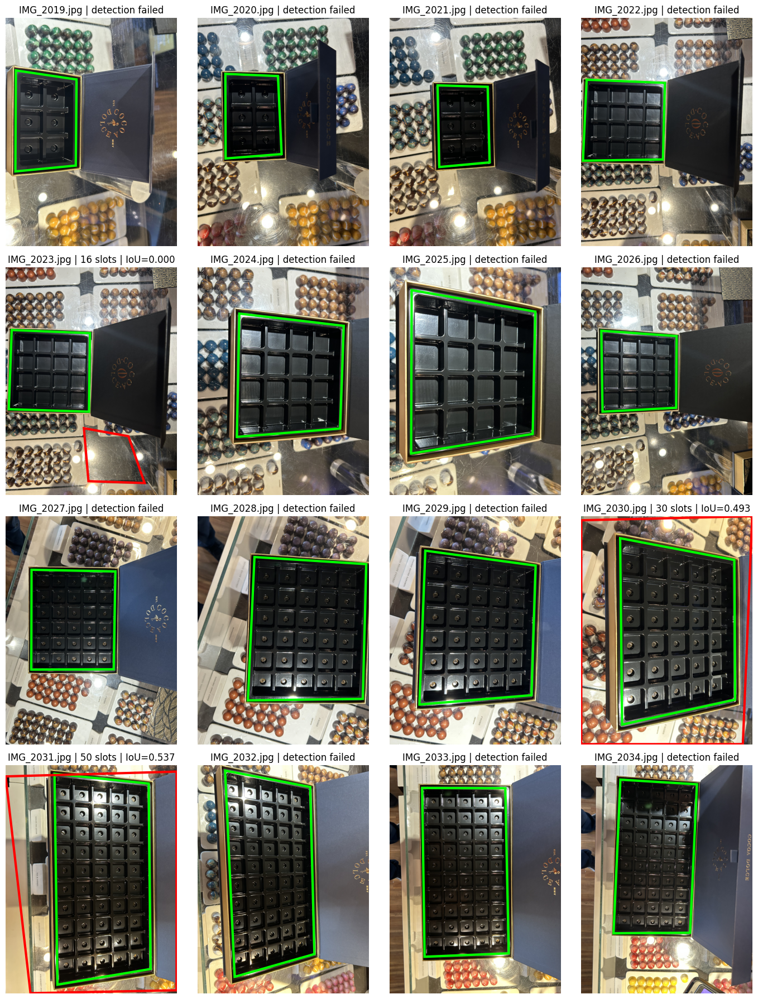

In [9]:
fig, axes = plt.subplots(4, 4, figsize=(14, 18))

for axis, (_, row) in zip(axes.ravel(), box_manifest.iterrows()):
    image_path = RAW_DIR / row["file"]
    image = cv2.cvtColor(cv2.imread(str(image_path)), cv2.COLOR_BGR2RGB)
    ground_truth = load_ground_truth(Path(row["annotation_file"]))
    predicted = detections.get(row["file"])

    axis.imshow(image)
    axis.add_patch(plt.Polygon(ground_truth, fill=False, edgecolor="lime", linewidth=3))

    if predicted is not None:
        axis.add_patch(plt.Polygon(predicted, fill=False, edgecolor="red", linewidth=3))
        iou = localization_results.loc[localization_results["file"].eq(row["file"]), "polygon_iou"].iloc[0]
        axis.set_title(f'{row["file"]} | {row["box_size"]} slots | IoU={iou:.3f}')
    else:
        axis.set_title(f'{row["file"]} | detection failed')

    axis.axis("off")

plt.tight_layout()
plt.show()

In [10]:
LOCALIZATION_SIZE = 320
VALIDATION_FILES = {"IMG_2020.jpg", "IMG_2023.jpg", "IMG_2030.jpg", "IMG_2034.jpg"}

localization_manifest = box_manifest[["file", "box_size", "annotation_file"]].copy()
localization_manifest["split"] = np.where(localization_manifest["file"].isin(VALIDATION_FILES), "validation", "train")

display(localization_manifest.groupby(["split", "box_size"]).size().rename("images").reset_index())

assert localization_manifest.query("split == 'train'").shape[0] == 12
assert localization_manifest.query("split == 'validation'").shape[0] == 4
assert not set(localization_manifest.query("split == 'train'")["file"]) & VALIDATION_FILES

print("PASS: localization split contains 12 training and 4 validation source images")

,split,box_size,images
0,train,6,2
1,train,16,4
2,train,30,3
3,train,50,3
4,validation,6,1
5,validation,16,1
6,validation,30,1
7,validation,50,1


PASS: localization split contains 12 training and 4 validation source images


In [11]:
def augment_box_image(image, corners, output_size=320, rng=None):
    rng = np.random.default_rng() if rng is None else rng
    height, width = image.shape[:2]

    source = np.float32([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]])
    jitter_x, jitter_y = 0.07 * width, 0.07 * height
    destination = source + np.column_stack([
        rng.uniform(-jitter_x, jitter_x, 4),
        rng.uniform(-jitter_y, jitter_y, 4)
    ]).astype(np.float32)

    homography = cv2.getPerspectiveTransform(source, destination)
    transformed = cv2.warpPerspective(image, homography, (width, height), borderMode=cv2.BORDER_REFLECT)
    transformed_corners = cv2.perspectiveTransform(corners[None], homography)[0]

    if rng.random() < 0.5:
        transformed = cv2.flip(transformed, 1)
        transformed_corners[:, 0] = width - 1 - transformed_corners[:, 0]
        transformed_corners = transformed_corners[[1, 0, 3, 2]]

    alpha, beta = rng.uniform(0.75, 1.25), rng.uniform(-25, 25)
    transformed = cv2.convertScaleAbs(transformed, alpha=alpha, beta=beta)
    transformed = cv2.resize(transformed, (output_size, output_size), interpolation=cv2.INTER_AREA)
    transformed_corners *= np.array([output_size / width, output_size / height], dtype=np.float32)

    return transformed, transformed_corners

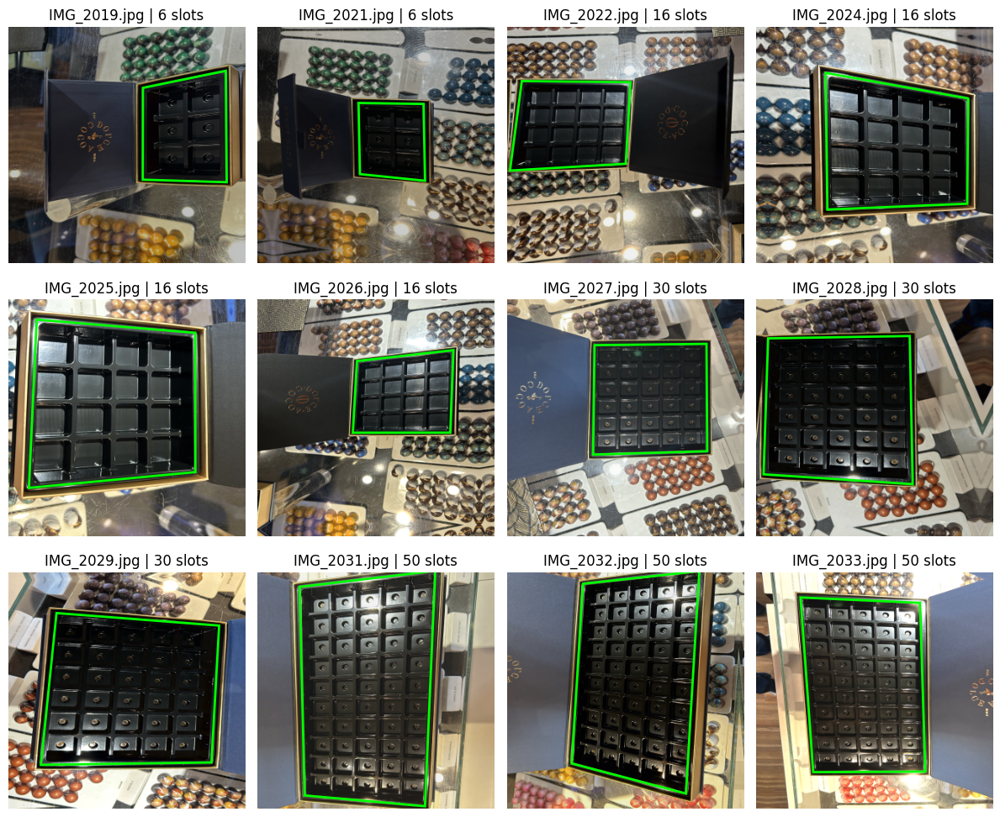

In [12]:
training_rows = localization_manifest.query("split == 'train'").reset_index(drop=True)
rng = np.random.default_rng(20260917)
fig, axes = plt.subplots(3, 4, figsize=(12, 10))

for axis, (_, row) in zip(axes.ravel(), training_rows.iterrows()):
    image = cv2.cvtColor(cv2.imread(str(RAW_DIR / row["file"])), cv2.COLOR_BGR2RGB)
    corners = load_ground_truth(Path(row["annotation_file"]))
    augmented, augmented_corners = augment_box_image(image, corners, LOCALIZATION_SIZE, rng)

    axis.imshow(augmented)
    axis.add_patch(plt.Polygon(augmented_corners, fill=False, edgecolor="lime", linewidth=2))
    axis.set_title(f'{row["file"]} | {row["box_size"]} slots')
    axis.axis("off")

plt.tight_layout()
plt.show()

In [13]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LOCALIZATION_SIZE, TRAIN_REPEATS, RANDOM_SEED = 224, 30, 20260917
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

class BoxCornerDataset(Dataset):
    def __init__(self, manifest, training=False):
        self.manifest = manifest.reset_index(drop=True)
        self.training = training
        self.repeats = TRAIN_REPEATS if training else 1
        self.mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
        self.std = np.array([0.229, 0.224, 0.225], dtype=np.float32)

    def __len__(self):
        return len(self.manifest) * self.repeats

    def __getitem__(self, index):
        row = self.manifest.iloc[index % len(self.manifest)]
        image = cv2.cvtColor(cv2.imread(str(RAW_DIR / row["file"])), cv2.COLOR_BGR2RGB)
        corners = load_ground_truth(Path(row["annotation_file"]))

        if self.training:
            rng = np.random.default_rng(RANDOM_SEED + index + np.random.randint(0, 1_000_000))
            image, corners = augment_box_image(image, corners, LOCALIZATION_SIZE, rng)
        else:
            height, width = image.shape[:2]
            image = cv2.resize(image, (LOCALIZATION_SIZE, LOCALIZATION_SIZE), interpolation=cv2.INTER_AREA)
            corners *= np.array([LOCALIZATION_SIZE / width, LOCALIZATION_SIZE / height], dtype=np.float32)

        image = (image.astype(np.float32) / 255.0 - self.mean) / self.std
        image = torch.from_numpy(image.transpose(2, 0, 1))
        target = torch.from_numpy(np.clip(corners / LOCALIZATION_SIZE, 0, 1).reshape(-1).astype(np.float32))
        return image, target, row["file"]

train_data = BoxCornerDataset(localization_manifest.query("split == 'train'"), training=True)
validation_data = BoxCornerDataset(localization_manifest.query("split == 'validation'"))
train_loader = DataLoader(train_data, batch_size=16, shuffle=True, num_workers=2)
validation_loader = DataLoader(validation_data, batch_size=4, shuffle=False, num_workers=0)

class EfficientNetCornerRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        backbone = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        self.features = backbone.features
        self.pool = nn.AdaptiveAvgPool2d((2, 2))
        self.regressor = nn.Sequential(nn.Flatten(), nn.Linear(1280 * 4, 256), nn.ReLU(),
                                       nn.Dropout(0.2), nn.Linear(256, 8), nn.Sigmoid())

    def forward(self, x):
        return self.regressor(self.pool(self.features(x)))

model = EfficientNetCornerRegressor().to(DEVICE)
for parameter in model.features.parameters():
    parameter.requires_grad = False

print("Device:", DEVICE)
print("Training examples per epoch:", len(train_data))
print("Validation source images:", len(validation_data))
print("Trainable parameters:", sum(p.numel() for p in model.parameters() if p.requires_grad))

Device: cuda
Training examples per epoch: 360
Validation source images: 4
Trainable parameters: 1313032


In [14]:
EXPERIMENT_DIR = PROJECT_ROOT / "data/experiments/box_localization_v1"
OUTPUT_DIR = EXPERIMENT_DIR / "outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
MODEL_FILE = OUTPUT_DIR / "efficientnet_b0_corner_regressor.pt"

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = DEVICE.type == "cuda"
AMP_DTYPE = torch.float16

for p in model.features.parameters():
    p.requires_grad_(False)

model = model.to(DEVICE)
model.features.eval()

def fast_forward(net, images):
    with torch.no_grad():
        features = net.features(images)
    first_layer = next(iter(net.regressor.children()), None)
    if isinstance(first_layer, nn.Conv2d):
        return net.regressor(features)
    return net.regressor(torch.flatten(features, 1))

train_loader = DataLoader(train_data, batch_size=64, shuffle=True, num_workers=2, pin_memory=True, persistent_workers=True)
validation_loader = DataLoader(validation_data, batch_size=64, shuffle=False, num_workers=2, pin_memory=True, persistent_workers=True)

criterion = nn.SmoothL1Loss(beta=0.03)
optimizer = torch.optim.AdamW((p for p in model.regressor.parameters() if p.requires_grad), lr=2e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)
scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)

history, best_loss = [], float("inf")
epochs = 20

for epoch in range(1, epochs + 1):
    model.train()
    model.features.eval()
    train_loss = 0.0

    for images, targets, _ in train_loader:
        images = images.to(DEVICE, non_blocking=True)
        targets = targets.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE, enabled=USE_AMP):
            loss = criterion(fast_forward(model, images), targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item() * images.size(0)

    model.eval()
    validation_loss = 0.0

    with torch.inference_mode():
        for images, targets, _ in validation_loader:
            images = images.to(DEVICE, non_blocking=True)
            targets = targets.to(DEVICE, non_blocking=True)
            with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE, enabled=USE_AMP):
                loss = criterion(fast_forward(model, images), targets)
            validation_loss += loss.item() * images.size(0)

    train_loss /= len(train_data)
    validation_loss /= len(validation_data)
    scheduler.step()
    history.append({"epoch": epoch, "train_loss": train_loss, "validation_loss": validation_loss})

    if validation_loss < best_loss:
        best_loss = validation_loss
        torch.save(model.state_dict(), MODEL_FILE)

    print(f"Epoch {epoch:02d}/{epochs} | train={train_loss:.5f} | validation={validation_loss:.5f}")

model.load_state_dict(torch.load(MODEL_FILE, map_location=DEVICE, weights_only=True))
history = pd.DataFrame(history)
print("Best validation loss:", round(best_loss, 6))
print("Saved:", MODEL_FILE)
history.plot(x="epoch", y=["train_loss", "validation_loss"], figsize=(8, 4), grid=True)
plt.show()

RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x62720 and 5120x256)

In [ ]:
model.eval()
validation_predictions = []

with torch.inference_mode():
    for images, targets, files in validation_loader:
        predictions = fast_forward(model, images.to(DEVICE, non_blocking=True)).float().cpu().numpy().reshape(-1, 4, 2)

        for file, predicted_normalized in zip(files, predictions):
            image = cv2.imread(str(RAW_DIR / file))
            height, width = image.shape[:2]
            predicted = predicted_normalized * np.array([width, height])
            row = localization_manifest.loc[localization_manifest["file"].eq(file)].iloc[0]
            ground_truth = load_ground_truth(Path(row["annotation_file"]))
            error = np.linalg.norm(predicted - ground_truth, axis=1).mean()

            validation_predictions.append({
                "file": file,
                "box_size": int(row["box_size"]),
                "corner_error_px": error,
                "normalized_corner_error": error / np.hypot(width, height),
                "polygon_iou": polygon_iou(ground_truth, predicted, image.shape),
                "predicted_corners": predicted
            })

localizer_results = pd.DataFrame(validation_predictions)
display(localizer_results.drop(columns="predicted_corners"))

fig, axes = plt.subplots(1, len(validation_predictions), figsize=(16, 5))
for axis, result in zip(axes, validation_predictions):
    image = cv2.cvtColor(cv2.imread(str(RAW_DIR / result["file"])), cv2.COLOR_BGR2RGB)
    row = localization_manifest.loc[localization_manifest["file"].eq(result["file"])].iloc[0]
    ground_truth = load_ground_truth(Path(row["annotation_file"]))
    axis.imshow(image)
    axis.add_patch(plt.Polygon(ground_truth, fill=False, edgecolor="lime", linewidth=3))
    axis.add_patch(plt.Polygon(result["predicted_corners"], fill=False, edgecolor="red", linewidth=3))
    axis.set_title(f'{result["file"]}\nIoU={result["polygon_iou"]:.3f}')
    axis.axis("off")

plt.tight_layout()
plt.show()
print("Mean IoU:", round(localizer_results["polygon_iou"].mean(), 4))
print("Mean normalized corner error:", round(localizer_results["normalized_corner_error"].mean(), 4))

In [15]:
from torch.utils.data import WeightedRandomSampler

class SpatialEfficientNetCornerRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        backbone = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        self.features = backbone.features
        self.regressor = nn.Sequential(
            nn.Conv2d(1280, 64, 1), nn.BatchNorm2d(64), nn.SiLU(),
            nn.AdaptiveAvgPool2d((7, 7)), nn.Flatten(),
            nn.Linear(64 * 7 * 7, 256), nn.SiLU(), nn.Dropout(0.25),
            nn.Linear(256, 8), nn.Sigmoid()
        )

    def forward(self, x):
        return self.regressor(self.features(x))

train_rows = localization_manifest.query("split == 'train'").reset_index(drop=True)
size_counts = train_rows["box_size"].value_counts()
sample_weights = [1 / size_counts[train_rows.iloc[i % len(train_rows)]["box_size"]] for i in range(len(train_data))]
sampler = WeightedRandomSampler(torch.as_tensor(sample_weights, dtype=torch.double), len(train_data), replacement=True)

train_loader_balanced = DataLoader(train_data, batch_size=64, sampler=sampler, num_workers=2, pin_memory=True, persistent_workers=True)

spatial_model = SpatialEfficientNetCornerRegressor().to(DEVICE)
for p in spatial_model.features.parameters():
    p.requires_grad_(False)

SPATIAL_MODEL_FILE = OUTPUT_DIR / "efficientnet_b0_spatial_corner_regressor.pt"
print("Device:", DEVICE)
print("Trainable parameters:", sum(p.numel() for p in spatial_model.parameters() if p.requires_grad))
print("Balanced examples per epoch:", len(train_data))

Device: cuda
Trainable parameters: 887240
Balanced examples per epoch: 360


Epoch 01/50 | train=0.10636 | validation=0.09795
Epoch 02/50 | train=0.04153 | validation=0.04095
Epoch 03/50 | train=0.03147 | validation=0.02300
Epoch 04/50 | train=0.02623 | validation=0.02281
Epoch 05/50 | train=0.02390 | validation=0.02497
Epoch 06/50 | train=0.02134 | validation=0.01885
Epoch 07/50 | train=0.01957 | validation=0.02032
Epoch 08/50 | train=0.01750 | validation=0.01841
Epoch 09/50 | train=0.01553 | validation=0.01706
Epoch 10/50 | train=0.01471 | validation=0.01559
Epoch 11/50 | train=0.01530 | validation=0.02014
Epoch 12/50 | train=0.01469 | validation=0.01462
Epoch 13/50 | train=0.01407 | validation=0.01440
Epoch 14/50 | train=0.01298 | validation=0.01587
Epoch 15/50 | train=0.01201 | validation=0.01454
Epoch 16/50 | train=0.01202 | validation=0.01311
Epoch 17/50 | train=0.01242 | validation=0.01552
Epoch 18/50 | train=0.01118 | validation=0.01478
Epoch 19/50 | train=0.01161 | validation=0.01566
Epoch 20/50 | train=0.01171 | validation=0.01497
Epoch 21/50 | train=

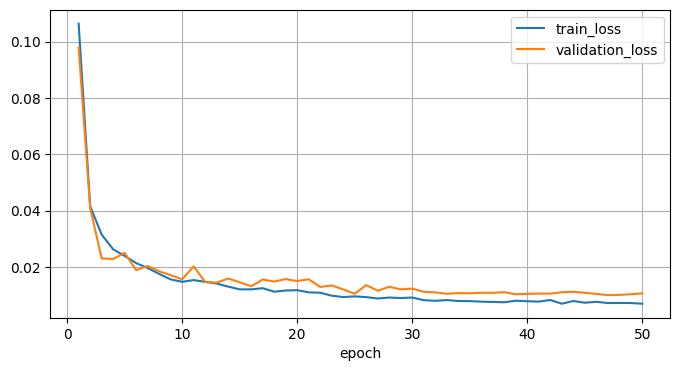

In [16]:
def spatial_fast_forward(images):
    with torch.no_grad():
        features = spatial_model.features(images)
    return spatial_model.regressor(features)

criterion = nn.SmoothL1Loss(beta=0.03)
optimizer = torch.optim.AdamW(spatial_model.regressor.parameters(), lr=1e-3, weight_decay=2e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.4, patience=4)
scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)

best_loss, patience, epochs_without_improvement, spatial_history = float("inf"), 10, 0, []
epochs = 50

for epoch in range(1, epochs + 1):
    spatial_model.train()
    spatial_model.features.eval()
    train_loss = 0.0

    for images, targets, _ in train_loader_balanced:
        images = images.to(DEVICE, non_blocking=True)
        targets = targets.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE, enabled=USE_AMP):
            loss = criterion(spatial_fast_forward(images), targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item() * images.size(0)

    spatial_model.eval()
    validation_loss = 0.0

    with torch.inference_mode():
        for images, targets, _ in validation_loader:
            images = images.to(DEVICE, non_blocking=True)
            targets = targets.to(DEVICE, non_blocking=True)
            with torch.autocast(device_type=DEVICE.type, dtype=AMP_DTYPE, enabled=USE_AMP):
                loss = criterion(spatial_fast_forward(images), targets)
            validation_loss += loss.item() * images.size(0)

    train_loss /= len(train_data)
    validation_loss /= len(validation_data)
    scheduler.step(validation_loss)
    spatial_history.append({"epoch": epoch, "train_loss": train_loss, "validation_loss": validation_loss})

    if validation_loss < best_loss:
        best_loss, epochs_without_improvement = validation_loss, 0
        torch.save(spatial_model.state_dict(), SPATIAL_MODEL_FILE)
    else:
        epochs_without_improvement += 1

    print(f"Epoch {epoch:02d}/{epochs} | train={train_loss:.5f} | validation={validation_loss:.5f}")

    if epochs_without_improvement >= patience:
        print(f"Early stopping at epoch {epoch}")
        break

spatial_model.load_state_dict(torch.load(SPATIAL_MODEL_FILE, map_location=DEVICE, weights_only=True))
model = spatial_model
spatial_history = pd.DataFrame(spatial_history)

print("Best validation loss:", round(best_loss, 6))
print("Saved:", SPATIAL_MODEL_FILE)
spatial_history.plot(x="epoch", y=["train_loss", "validation_loss"], figsize=(8, 4), grid=True)
plt.show()

,file,box_size,corner_error_px,normalized_corner_error,polygon_iou
0,IMG_2020.jpg,6,114.236811,0.022666,0.778023
1,IMG_2023.jpg,16,45.796977,0.009087,0.928308
2,IMG_2030.jpg,30,123.414697,0.024487,0.921521
3,IMG_2034.jpg,50,168.112506,0.033356,0.851196


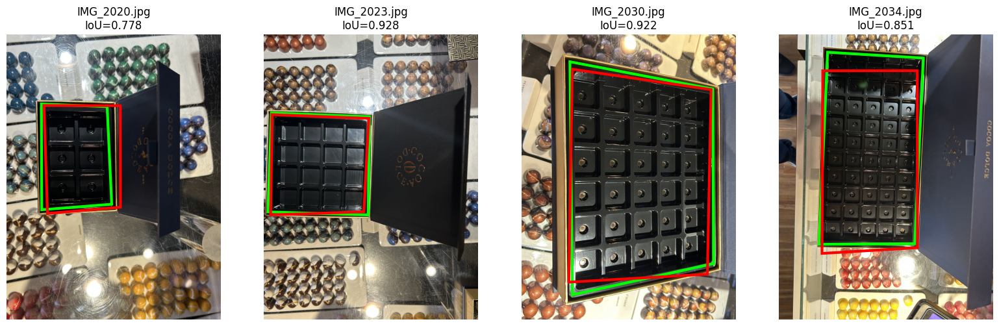

Mean IoU: 0.8698
Mean normalized corner error: 0.0224


In [22]:
model = spatial_model
model.eval()
validation_predictions = []

with torch.inference_mode():
    for images, _, files in validation_loader:
        predictions = model(images.to(DEVICE, non_blocking=True)).float().cpu().numpy().reshape(-1, 4, 2)

        for file, predicted_normalized in zip(files, predictions):
            image = cv2.imread(str(RAW_DIR / file))
            height, width = image.shape[:2]
            predicted = predicted_normalized * np.array([width, height])
            row = localization_manifest.loc[localization_manifest["file"].eq(file)].iloc[0]
            ground_truth = load_ground_truth(Path(row["annotation_file"]))
            error = np.linalg.norm(predicted - ground_truth, axis=1).mean()

            validation_predictions.append({
                "file": file,
                "box_size": int(row["box_size"]),
                "corner_error_px": error,
                "normalized_corner_error": error / np.hypot(width, height),
                "polygon_iou": polygon_iou(ground_truth, predicted, image.shape),
                "predicted_corners": predicted
            })

localizer_results = pd.DataFrame(validation_predictions)
display(localizer_results.drop(columns="predicted_corners"))

fig, axes = plt.subplots(1, len(validation_predictions), figsize=(16, 5))
for axis, result in zip(axes, validation_predictions):
    image = cv2.cvtColor(cv2.imread(str(RAW_DIR / result["file"])), cv2.COLOR_BGR2RGB)
    row = localization_manifest.loc[localization_manifest["file"].eq(result["file"])].iloc[0]
    ground_truth = load_ground_truth(Path(row["annotation_file"]))

    axis.imshow(image)
    axis.add_patch(plt.Polygon(ground_truth, fill=False, edgecolor="lime", linewidth=3))
    axis.add_patch(plt.Polygon(result["predicted_corners"], fill=False, edgecolor="red", linewidth=3))
    axis.set_title(f'{result["file"]}\nIoU={result["polygon_iou"]:.3f}')
    axis.axis("off")

plt.tight_layout()
plt.show()

print("Mean IoU:", round(localizer_results["polygon_iou"].mean(), 4))
print("Mean normalized corner error:", round(localizer_results["normalized_corner_error"].mean(), 4))

In [23]:
BOX_SIZES = [6, 16, 30, 50]
SIZE_TO_INDEX = {size: i for i, size in enumerate(BOX_SIZES)}
FILE_TO_SIZE = localization_manifest.set_index("file")["box_size"].astype(int).to_dict()
BOX_SIZE_MODEL_FILE = OUTPUT_DIR / "efficientnet_b0_box_size_classifier.pt"

class EfficientNetBoxSizeClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        backbone = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        self.features = backbone.features
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(nn.Flatten(), nn.Linear(1280, 128), nn.SiLU(), nn.Dropout(0.2), nn.Linear(128, 4))

    def forward(self, x):
        with torch.no_grad():
            x = self.features(x)
        return self.classifier(self.pool(x))

box_size_model = EfficientNetBoxSizeClassifier().to(DEVICE)
for p in box_size_model.features.parameters():
    p.requires_grad_(False)

print("Classes:", BOX_SIZES)
print("Trainable parameters:", sum(p.numel() for p in box_size_model.parameters() if p.requires_grad))

Classes: [6, 16, 30, 50]
Trainable parameters: 164484


In [24]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(box_size_model.classifier.parameters(), lr=2e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.4, patience=3)
scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)

best_loss, patience, waiting, size_history = float("inf"), 8, 0, []

for epoch in range(1, 31):
    box_size_model.train()
    box_size_model.features.eval()
    train_loss, train_correct, train_count = 0.0, 0, 0

    for images, _, files in train_loader_balanced:
        images = images.to(DEVICE, non_blocking=True)
        labels = torch.tensor([SIZE_TO_INDEX[FILE_TO_SIZE[file]] for file in files], device=DEVICE)
        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(device_type=DEVICE.type, dtype=torch.float16, enabled=USE_AMP):
            logits = box_size_model(images)
            loss = criterion(logits, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item() * images.size(0)
        train_correct += logits.argmax(1).eq(labels).sum().item()
        train_count += images.size(0)

    box_size_model.eval()
    validation_loss, validation_correct, validation_count = 0.0, 0, 0

    with torch.inference_mode():
        for images, _, files in validation_loader:
            images = images.to(DEVICE, non_blocking=True)
            labels = torch.tensor([SIZE_TO_INDEX[FILE_TO_SIZE[file]] for file in files], device=DEVICE)
            logits = box_size_model(images)
            validation_loss += criterion(logits, labels).item() * images.size(0)
            validation_correct += logits.argmax(1).eq(labels).sum().item()
            validation_count += images.size(0)

    train_loss /= train_count
    validation_loss /= validation_count
    train_accuracy = train_correct / train_count
    validation_accuracy = validation_correct / validation_count
    size_history.append({"epoch": epoch, "train_loss": train_loss, "validation_loss": validation_loss, "train_accuracy": train_accuracy, "validation_accuracy": validation_accuracy})
    scheduler.step(validation_loss)

    if validation_loss < best_loss:
        best_loss, waiting = validation_loss, 0
        torch.save(box_size_model.state_dict(), BOX_SIZE_MODEL_FILE)
    else:
        waiting += 1

    print(f"Epoch {epoch:02d}/30 | train={train_loss:.4f}/{train_accuracy:.3f} | validation={validation_loss:.4f}/{validation_accuracy:.3f}")

    if waiting >= patience:
        print(f"Early stopping at epoch {epoch}")
        break

box_size_model.load_state_dict(torch.load(BOX_SIZE_MODEL_FILE, map_location=DEVICE, weights_only=True))
size_history = pd.DataFrame(size_history)
print("Best validation loss:", round(best_loss, 6))
print("Saved:", BOX_SIZE_MODEL_FILE)

Epoch 01/30 | train=0.7017/0.811 | validation=0.2937/1.000
Epoch 02/30 | train=0.0227/1.000 | validation=0.0538/1.000
Epoch 03/30 | train=0.0009/1.000 | validation=0.0143/1.000
Epoch 04/30 | train=0.0001/1.000 | validation=0.0067/1.000
Epoch 05/30 | train=0.0000/1.000 | validation=0.0045/1.000
Epoch 06/30 | train=0.0000/1.000 | validation=0.0036/1.000
Epoch 07/30 | train=0.0000/1.000 | validation=0.0031/1.000
Epoch 08/30 | train=0.0000/1.000 | validation=0.0029/1.000
Epoch 09/30 | train=0.0000/1.000 | validation=0.0028/1.000
Epoch 10/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 11/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 12/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 13/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 15/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 16/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 17/30 | train=0.0000/1.000 | validation=0.0027/1.000
Epoch 18/30 | train=0.0000/1.000 | validation=0.0027/1.0

In [25]:
box_size_model.eval()
size_predictions = []

with torch.inference_mode():
    for images, _, files in validation_loader:
        probabilities = box_size_model(images.to(DEVICE, non_blocking=True)).softmax(1).cpu()

        for file, probability in zip(files, probabilities):
            predicted_index = int(probability.argmax())
            predicted_size = BOX_SIZES[predicted_index]
            true_size = FILE_TO_SIZE[file]
            size_predictions.append({
                "file": file,
                "true_box_size": true_size,
                "predicted_box_size": predicted_size,
                "confidence": float(probability[predicted_index]),
                "correct": predicted_size == true_size
            })

box_size_results = pd.DataFrame(size_predictions)
display(box_size_results)

accuracy = box_size_results["correct"].mean()
print("Box-size accuracy:", round(accuracy, 4))
print("Correct:", int(box_size_results["correct"].sum()), "/", len(box_size_results))

,file,true_box_size,predicted_box_size,confidence,correct
0,IMG_2020.jpg,6,6,0.999999,True
1,IMG_2023.jpg,16,16,0.999996,True
2,IMG_2030.jpg,30,30,0.995392,True
3,IMG_2034.jpg,50,50,0.994017,True


Box-size accuracy: 1.0
Correct: 4 / 4


In [29]:
GRID_LAYOUTS = {6: (3, 2), 16: (4, 4), 30: (6, 5), 50: (10, 5)}
SLOT_SIZE = 224

def order_corners(points):
    points = np.asarray(points, dtype=np.float32)
    total, difference = points.sum(1), np.diff(points, axis=1).ravel()
    return np.array([points[np.argmin(total)], points[np.argmin(difference)], points[np.argmax(total)], points[np.argmax(difference)]], dtype=np.float32)

def warp_box(image, corners, box_size):
    rows, columns = GRID_LAYOUTS[box_size]
    width, height = columns * SLOT_SIZE, rows * SLOT_SIZE
    source = order_corners(corners)
    destination = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype=np.float32)
    matrix = cv2.getPerspectiveTransform(source, destination)
    return cv2.warpPerspective(image, matrix, (width, height))

print("Layouts:", GRID_LAYOUTS)

Layouts: {6: (3, 2), 16: (4, 4), 30: (6, 5), 50: (10, 5)}


In [30]:
spatial_model.eval()
box_size_model.eval()
automatic_results = []

with torch.inference_mode():
    for images, _, files in validation_loader:
        gpu_images = images.to(DEVICE, non_blocking=True)

        with torch.autocast(device_type=DEVICE.type, dtype=torch.float16, enabled=USE_AMP):
            corner_predictions = spatial_model(gpu_images).float().cpu().numpy().reshape(-1, 4, 2)
            size_probabilities = box_size_model(gpu_images).softmax(1).float().cpu().numpy()

        for file, normalized_corners, probabilities in zip(files, corner_predictions, size_probabilities):
            image = cv2.imread(str(RAW_DIR / file))
            height, width = image.shape[:2]
            predicted_corners = normalized_corners * np.array([width, height], dtype=np.float32)
            predicted_size = BOX_SIZES[int(probabilities.argmax())]
            warped = warp_box(image, predicted_corners, predicted_size)

            rows, columns = GRID_LAYOUTS[predicted_size]
            slots = []
            for row in range(rows):
                for column in range(columns):
                    y1, y2 = row * SLOT_SIZE, (row + 1) * SLOT_SIZE
                    x1, x2 = column * SLOT_SIZE, (column + 1) * SLOT_SIZE
                    slots.append(warped[y1:y2, x1:x2].copy())

            automatic_results.append({
                "file": file,
                "predicted_size": predicted_size,
                "confidence": float(probabilities.max()),
                "predicted_corners": predicted_corners,
                "warped": warped,
                "slots": slots
            })

summary = pd.DataFrame([{
    "file": result["file"],
    "predicted_size": result["predicted_size"],
    "confidence": result["confidence"],
    "extracted_slots": len(result["slots"])
} for result in automatic_results])

display(summary)
assert all(row["predicted_size"] == row["extracted_slots"] for _, row in summary.iterrows())
print("Automatic extraction passed for all validation images.")

,file,predicted_size,confidence,extracted_slots
0,IMG_2020.jpg,6,0.999999,6
1,IMG_2023.jpg,16,0.999996,16
2,IMG_2030.jpg,30,0.995502,30
3,IMG_2034.jpg,50,0.993951,50


Automatic extraction passed for all validation images.


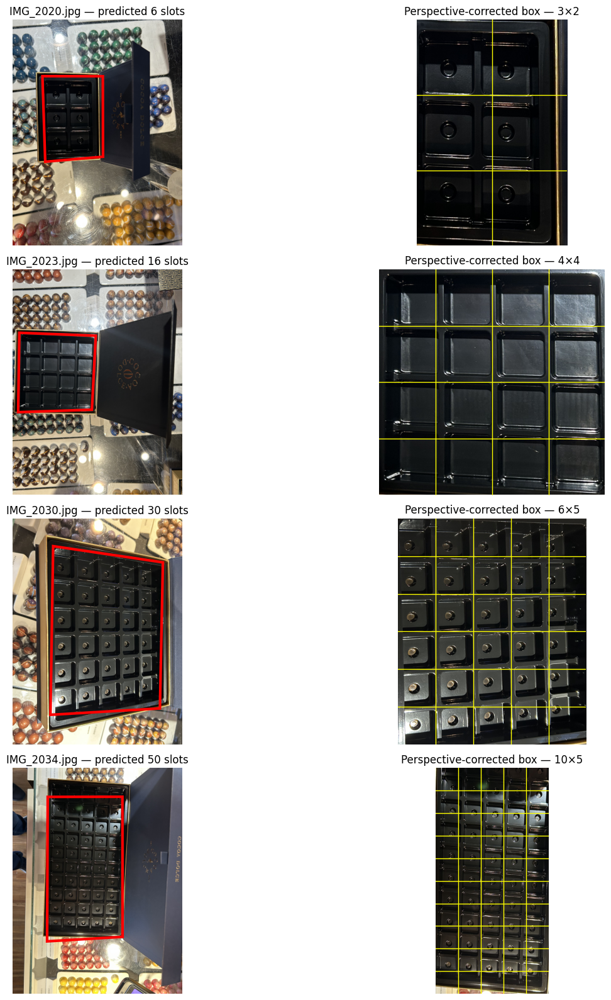

In [31]:
fig, axes = plt.subplots(len(automatic_results), 2, figsize=(16, 4 * len(automatic_results)))
axes = np.atleast_2d(axes)

for row, result in enumerate(automatic_results):
    original = cv2.cvtColor(cv2.imread(str(RAW_DIR / result["file"])), cv2.COLOR_BGR2RGB)
    warped = cv2.cvtColor(result["warped"], cv2.COLOR_BGR2RGB)
    corners = result["predicted_corners"]

    axes[row, 0].imshow(original)
    axes[row, 0].add_patch(plt.Polygon(corners, fill=False, edgecolor="red", linewidth=3))
    axes[row, 0].set_title(f'{result["file"]} — predicted {result["predicted_size"]} slots')
    axes[row, 0].axis("off")

    axes[row, 1].imshow(warped)
    rows, columns = GRID_LAYOUTS[result["predicted_size"]]
    for r in range(1, rows):
        axes[row, 1].axhline(r * SLOT_SIZE, color="yellow", linewidth=1)
    for c in range(1, columns):
        axes[row, 1].axvline(c * SLOT_SIZE, color="yellow", linewidth=1)
    axes[row, 1].set_title(f'Perspective-corrected box — {rows}×{columns}')
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()